In [10]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

import pandas as pd
import numpy as np
from scipy.signal import find_peaks
from scipy import interpolate
import sys
sys.path.append('/Users/pujasaha/Desktop/SleepDebt/Python_scripts')
from model import *
from protocols import *
from plotting import *
import yaml
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [35]:
def sleep_debt(protocol_list, definition, unified=False):

    j = 1

    # Parameters for subplot grid
    rows = 2
    cols = 2
    total_plots = rows * cols

    # Initialize subplot position and figure
    i1 = 1
    fig = plt.figure(figsize=(20, 10))
    for protocol in protocol_list:
        print(protocol)
        S0 = 0
        L0 = 0
        t0 = 0
        s, l, t, eff = [], [], [], []

        t_ae_sl = construct_protocol(DATA, protocol)
        t_awake_l = t_ae_sl[0]
        t_sleep_l = t_ae_sl[1]

        for t_awake, t_sleep in zip(t_awake_l, t_sleep_l):
            FD = False

            # for FD protocol only
            if "protocol8" in protocol:
                if (t_awake + t_sleep) != 1440:
                    FD = True
                else:
                    FD = False

            if Unified == True:
                t1, s1, l1 = simulate_unified(
                    t_awake=t_awake, t_sleep=t_sleep, s0=S0, l0=L0, t0=t0, forced=FD
                )
            s += s1
            t += t1
            l += l1
            # eff+= eff1
            S0 = s1[-1]
            L0 = l1[-1]
            t0 = t1[-1]

        s = np.array(s) / U
        l = np.array(l) / U
        data = [pair for pair in zip(t, l, s)]
        df_sleep_debt = pd.DataFrame(data, columns=["time", "l", "s"])

        # sleep-awake status
        time_elapsed = 0
        time_count = list()
        time_count.append(0)
        for i in range(len(t_ae_sl[0])):
            # print(len(t_ae_sl[0]))
            time_elapsed = time_elapsed + t_awake_l[i]
            time_count.append(time_elapsed)
            time_elapsed = time_elapsed + t_sleep_l[i]
            time_count.append(time_elapsed)

        # print(time_count)
        # print(len(time_count))

        df_sleep_debt["status"] = df_sleep_debt["time"].apply(
            lambda x: get_interval(x, time_count)
        )

        if j > total_plots:
            plt.savefig("sleep_debt_combined_f{}.png".format(i1))
            plt.show()
            fig = plt.figure(figsize=(20, 10))
            i1 = i1 + 1
            j = 1

        ax = plt.subplot(rows, cols, j)  # (rows, columns, subplot number)
        j = j + 1

        get_plot(protocol, df_sleep_debt, t, time_count, definition, ax=ax)
        # Set common x and y labels for the figure
        fig.text(0.5, 0.05, "Time (days)", ha="center", va="center")
        fig.text(
            0.06,
            0.5,
            "Sleep Homeostat values % (impairment \u2192)",
            ha="center",
            va="center",
            rotation="vertical",
        )

        handles, labels = ax.get_legend_handles_labels()
        fig.legend(
            handles, labels, loc="upper center", ncol=3
        )  # Adjust location and column count as needed
        # plt.tight_layout()

    pass

In [3]:
def get_interval(t, time_ct):
    s = "awake"
    for i in range(1, len(time_ct), 2):
        print(i)
        if t > time_ct[i] and t <= time_ct[i + 1]:
            s = "sleep"
            break
    return s

In [22]:
def get_protocol_list():
    """getting protocol list dynamically"""
    protocol_list = []
    for i in range(1, 14):  # Assuming you have 3 protocols
        
        if i == 8:
            for j in range(1, 2):
                function_name = f"protocol{i}_{j}"
                print(function_name)
                protocol_func = globals().get(function_name)
                print(protocol_func)
                if protocol_func:
                    protocol_list.append(protocol_func)
        else:
            function_name = f"protocol{i}"
            print(function_name)
            protocol_func = globals().get(function_name)
            print(protocol_func)
            if protocol_func:
                protocol_list.append(protocol_func)
    print(protocol_list)
    return protocol_list

In [27]:
def get_protocols():
    protocol_list = []
    for i in range(1, 5):  # Assuming you have 3 protocols
        function_name = f"protocol{i}"
        print(function_name)
        protocol_list.append(function_name)
    print(protocol_list)
    return protocol_list

In [7]:
def read_yaml(file_path):
    with open(file_path, 'r') as file:
        data = yaml.safe_load(file)
    return data

protocol1
protocol2
protocol3
protocol4
['protocol1', 'protocol2', 'protocol3', 'protocol4']
['protocol1', 'protocol2', 'protocol3', 'protocol4']
protocol1
protocol1
<class 'str'>
<class 'str'>
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19
21
23
25
1
3
5
7
9
11
13
15
17
19

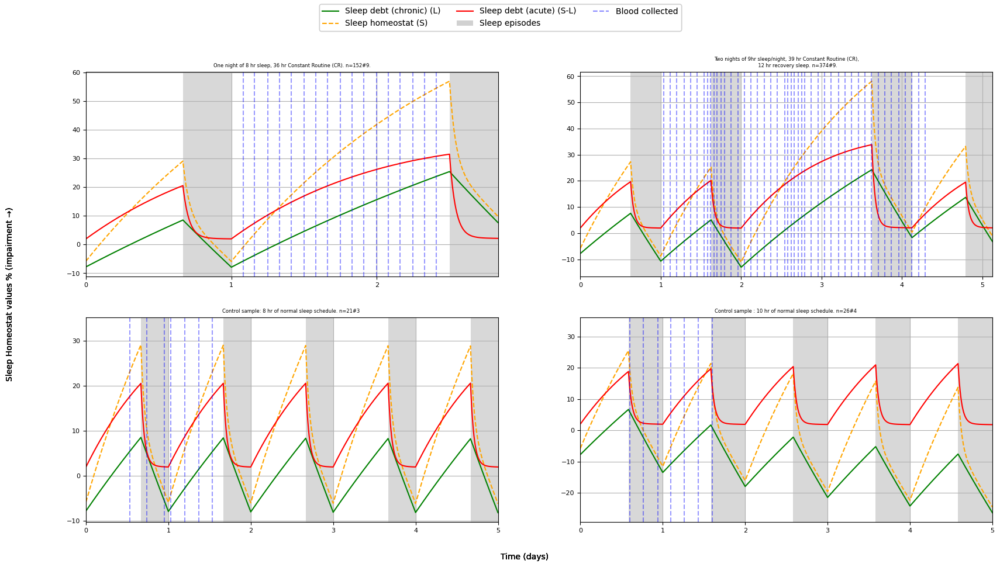

In [36]:
Unified = True
U=24.1
prot_list = get_protocols()
print(prot_list)
# Example usage
file_path = 'protocols.yaml'
DATA = read_yaml(file_path)


# Function that makes sleep debt plot
sleep_debt(prot_list, definition="def_2", unified=Unified)

In [17]:
def construct_protocol(data, protocol_name):
    print(protocol_name)
    protocol = data['protocols'][protocol_name]
    
    # Construct t_awake_l
    t_awake_l = []
    for item in protocol['t_awake_l']:
        print(type(item))
        if 'repeat' in item:
            repeat_value = protocol['t_awake_l'][item]['value'] # Ensure value is an integer
            repeat_count = protocol['t_awake_l'][item]['count']  # Ensure count is an integer
            t_awake_l.extend([repeat_value] * repeat_count)                
            
        else:
            append_value = protocol['t_awake_l']['append']  # Ensure append value is an integer
            t_awake_l.extend(append_value)  # Use append for single values
    
    
    # Construct t_sleep_l
    t_sleep_l = []
    for item in protocol['t_sleep_l']:
        if 'repeat' in item:
            repeat_value = protocol['t_sleep_l'][item]['value'] # Ensure value is an integer
            repeat_count = protocol['t_sleep_l'][item]['count']  # Ensure count is an integer
            t_sleep_l.extend([repeat_value] * repeat_count)                
            
        else:
            append_value = protocol['t_sleep_l']['append']  # Ensure append value is an integer
            t_sleep_l.extend(append_value)  # Use append for single values
    
    
    return t_awake_l, t_sleep_l

In [32]:
for protocol in prot_list:
    t_ae_sl = construct_protocol(DATA, protocol)
    t_awake_l = t_ae_sl[0]
    t_sleep_l = t_ae_sl[1]
    print(t_awake_l)
    print(t_sleep_l)


protocol1
<class 'str'>
<class 'str'>
[960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 2160]
[480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 480]
protocol2
<class 'str'>
<class 'str'>
<class 'str'>
[960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 900, 900, 2340, 960]
[480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 540, 540, 720, 480]
protocol3
<class 'str'>
[960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960]
[480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 480]
protocol4
<class 'str'>
<class 'str'>
[960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 840, 840, 840, 840, 840]
[480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 600, 600, 600, 600, 600]


In [1]:
pip install pyyaml

  Using cached PyYAML-6.0.1-cp312-cp312-macosx_11_0_arm64.whl.metadata (2.1 kB)
Using cached PyYAML-6.0.1-cp312-cp312-macosx_11_0_arm64.whl (165 kB)

[notice] A new release of pip is available: 24.0 -> 24.1.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [145]:
def read_yaml(file_path):
    with open(file_path, 'r') as file:
        data = yaml.safe_load(file)
    return data



def construct_protocol(data, protocol_name):
    print(protocol_name)
    protocol = data['protocols'][protocol_name]
    
    # Construct t_awake_l
    t_awake_l = []
    for item in protocol['t_awake_l']:
        print(type(item))
        if 'repeat' in item:
            repeat_value = protocol['t_awake_l'][item]['value'] # Ensure value is an integer
            repeat_count = protocol['t_awake_l'][item]['count']  # Ensure count is an integer
            t_awake_l.extend([repeat_value] * repeat_count)                
            
        else:
            append_value = protocol['t_awake_l']['append']  # Ensure append value is an integer
            t_awake_l.extend(append_value)  # Use append for single values
    
    
    # Construct t_sleep_l
    t_sleep_l = []
    for item in protocol['t_sleep_l']:
        if 'repeat' in item:
            repeat_value = protocol['t_sleep_l'][item]['value'] # Ensure value is an integer
            repeat_count = protocol['t_sleep_l'][item]['count']  # Ensure count is an integer
            t_sleep_l.extend([repeat_value] * repeat_count)                
            
        else:
            append_value = protocol['t_sleep_l']['append']  # Ensure append value is an integer
            t_sleep_l.extend(append_value)  # Use append for single values
    
    
    return t_awake_l, t_sleep_l
# Example usage
file_path = 'protocols.yaml'
data = read_yaml(file_path)

t_awake_l1, t_sleep_l1 = construct_protocol(data, 'protocol3')
print("Protocol 1 - t_awake_l:", t_awake_l1)
print("Protocol 1 - t_sleep_l:", t_sleep_l1)


t_awake_l2, t_sleep_l2 = construct_protocol(data, 'protocol4')
print("Protocol 2 - t_awake_l:", t_awake_l2)
print("Protocol 2 - t_sleep_l:", t_sleep_l2)


protocol3
<class 'str'>
Protocol 1 - t_awake_l: [960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960]
Protocol 1 - t_sleep_l: [480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 480]
protocol4
<class 'str'>
<class 'str'>
Protocol 2 - t_awake_l: [960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 840, 840, 840, 840, 840]
Protocol 2 - t_sleep_l: [480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 480, 600, 600, 600, 600, 600]


In [78]:
protocol = data['protocols']['protocol2']

In [79]:
item = protocol['t_awake_l']

In [80]:
item['repeat1']["count"]

'n_rest'

In [29]:
item['repeat']["value"]

960

In [30]:
item['repeat']["count"]* item['repeat']["value"]

11520

In [31]:
item["append"]

[2160]

In [32]:
t_awake_l = []
repeat_value = int(item['repeat']['value'])  # Ensure value is an integer
repeat_count = int(item['repeat']['count'])  # Ensure count is an integer
t_awake_l.extend([repeat_value] * repeat_count) 

In [33]:
t_awake_l

[960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960]

In [36]:
append_value = item['append']  # Ensure append value is an integer
t_awake_l.extend(append_value)  # Use append for single values

In [37]:
t_awake_l

[960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 960, 2160]

In [65]:
if 'repeat' in "repeat1":
    say= True
    print(say)

True


In [42]:
for item in protocol['t_awake_l']:
        if 'repeat' in item:
            repeat_value = ['repeat']['value'] # Ensure value is an integer
            repeat_count = item['repeat']['count']  # Ensure count is an integer
            t_awake_l.extend([repeat_value] * repeat_count)                
            
        else:
            append_value = int(item['append'])  # Ensure append value is an integer
            t_awake_l.extend(append_value) 

TypeError: string indices must be integers, not 'str'

In [47]:
item['repeat']

{'count': 12, 'value': 960}

In [59]:
for item in protocol['t_awake_l']:
    print(type(item))

<class 'str'>
<class 'str'>


In [54]:
protocol['t_awake_l']

{'repeat': {'count': 12, 'value': 960}, 'append': [2160]}

In [60]:
item[1]

'p'

In [21]:
construct_protocol(DATA,"protocol3")

protocol3
<class 'str'>


([960,
  960,
  960,
  960,
  960,
  960,
  960,
  960,
  960,
  960,
  960,
  960,
  960,
  960,
  960,
  960],
 [480,
  480,
  480,
  480,
  480,
  480,
  480,
  480,
  480,
  480,
  480,
  480,
  480,
  480,
  480,
  480])

In [37]:
pip install pandas-stubs


  Using cached pandas_stubs-2.2.2.240603-py3-none-any.whl.metadata (10 kB)
  Using cached types_pytz-2024.1.0.20240417-py3-none-any.whl.metadata (1.5 kB)
Using cached pandas_stubs-2.2.2.240603-py3-none-any.whl (157 kB)
Using cached types_pytz-2024.1.0.20240417-py3-none-any.whl (5.2 kB)

[notice] A new release of pip is available: 24.0 -> 24.1.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [1]:
pip install types-PyYAML

  Using cached types_PyYAML-6.0.12.20240311-py3-none-any.whl.metadata (1.5 kB)
Using cached types_PyYAML-6.0.12.20240311-py3-none-any.whl (15 kB)

[notice] A new release of pip is available: 24.0 -> 24.1.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [1]:
pip install types-scipy

ERROR: Could not find a version that satisfies the requirement types-scipy (from versions: none)
ERROR: No matching distribution found for types-scipy

[notice] A new release of pip is available: 24.0 -> 24.1.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.
